In [1]:
# Signal Efficiency Plotting Script
import argparse, os, math, ROOT, glob, uproot, time
# import numpy as np
# import matplotlib.pyplot as plt
# import random, string
# from IPython.display import Image

# from ROOT import gROOT
# # from pylab import *
# gROOT.SetStyle("ATLAS");


Welcome to JupyROOT 6.22/06
Error in callback <function _enable_matplotlib_integration.<locals>.configure_once at 0x7feba3978710> (for post_run_cell):


ImportError: cannot import name 'configure_inline_support_orig' from 'matplotlib_inline.backend_inline' (/home/newhouse/miniconda3/lib/python3.7/site-packages/matplotlib_inline/backend_inline.py)

In [2]:
def ATLASLabel(x, y, text=None, color=1):
    l = ROOT.TLatex()
    l.SetNDC()
    l.SetTextColor(color)
    l.DrawLatex(x, y, r"#bf{#it{ATLAS}}" + text)


def draw_text(*args, pos=(.5, .85)):
    x, y = pos

    ATLASLabel(x, y, "Internal")
    y = y - .05

    for text in args:
        # get latex note
        n = ROOT.TLatex()
        n.SetNDC()
        n.SetTextFont(43)
        n.SetTextColor(1)
        n.SetTextSize(30)
        n.DrawLatex(x, y, text)
        y = y - .05


def parse_sample(sample):
    tokens = sample.split('/histograms_')[1].split('.root')[0].split('_')
    sample_dict = {
        'mc': tokens[0],
        'dv': tokens[1],
        'mass': tokens[2],
        'lifetime': tokens[3],
    }
    return sample_dict

def make_cutflow_dict(hcutflow):
    cutflow_dict = {}
    for i in range(hcutflow.GetXaxis().GetNbins()):
        try:
            label = str(hcutflow.GetXaxis().GetLabels()[i])
            if "filter" in label: label = "filter mismatch"
        except:
            continue
            label = "no cut"
        value = hcutflow[i + 1]
        cutflow_dict[label] = value
    return cutflow_dict


def make_cutflow(ch_name='4filter_FP', color=ROOT.kAzure, histogram_path="", labels=[], output_file=""):
    # Open file and get cutflow
    file = ROOT.TFile(histogram_path)
    hcutflow = file.Get('VSI_LeptonsMod/CutFlow/CutFlow')

    # Create canvas
    # hcutflow.GetXaxis().SetBinLabel(3, ch_name)
    canvas_name = ''.join(random.choices(string.ascii_uppercase + string.digits, k=6))
    canvas = ROOT.TCanvas(canvas_name, "cutflow", 1000, 800)
    canvas.cd(1)

    # Prepare histogram settings for drawing
    ymax_cutflow = hcutflow.GetMaximum()
    hcutflow.GetYaxis().SetRangeUser(0, ymax_cutflow * 1.05)
    hcutflow.SetFillColor(color)
    hcutflow.SetLineWidth(0)
    hcutflow.GetXaxis().SetTickLength(0)
    hcutflow.SetMarkerSize(1.5)
    hcutflow.Draw("HIST TEXT0 SAME")

    # Add text information
    draw_text(*labels)

    # Display and save image
    # MyC02.Draw(canvas_name)
    canvas.SaveAs(output_file)
    # display(Image(output_file))

    return make_cutflow_dict(hcutflow)


def print_cutflow_to_file(cutflow_dict_tp, cutflow_dict_fp, output_file, name=""):
    # Print cutflows to text file
    with open(output_file, 'w') as f:
        # Print title
        print("cut".rjust(20), "True Positive".rjust(15), "False Positive".rjust(15), "Scale Factor".rjust(15), sep
              =" -", file=f)
        print("                 ------------------------------------------------------", file=f)
        # Print table
        for key in cutflow_dict_tp.keys():
            val_tp = cutflow_dict_tp[key]
            val_fp = cutflow_dict_fp[key]
            try: scale_factor = val_tp / (val_fp + val_tp)
            except: print("sounds like you tried to divide by zero")
            if key in ["all", "trigger"]: scale_factor = 1  # don't show scale factor before filter cut
            print(
                key.rjust(20), str(val_tp).rjust(15), str(val_fp).rjust(15), "{0:.4f}".format(scale_factor).rjust(15),
                sep
                ="  ", file=f)


def plot_stacked_cutflow(cutflow_dict_a, cutflow_dict_b, output_file, labels=[], name=""):
    # Prepare inputs
    fig, ax1 = plt.subplots(figsize=(18, 10))
    ind = np.arange(len(cutflow_dict_a))
    vals_a = np.array(list(cutflow_dict_a.values()))
    vals_b = np.array(list(cutflow_dict_b.values()))
#     vals_b[0:2] = [0, 0]
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color'][0:2]  # get colors for labels later

    # Plot stacked cutflow
    p_a = ax1.bar(ind, vals_a, width=1, label="Normal", color=colors[0])  # plot bar graph
    p_b = ax1.step(ind + .5, vals_b, label="Tracks dropped", color=colors[1])  # plot bar graph
    max_height = vals_a[0]
    plt.ylim((0, max_height * 1.2))
    plt.xticks(ind, cutflow_dict_a.keys(), rotation=60, ha='right', fontsize=15)
    plt.ylabel('Number of passed events', fontsize=20)
    ax1.legend(loc=(.65, .4), fontsize=20)

    # Print text labels on top of cutflow
    cmap = plt.cm.get_cmap('Oranges')
    for v, i in enumerate(ind):
        plt.text(i, vals_a[i] + max_height*0.02, "{:.0f}".format(vals_a[i]),
                 color=colors[0], fontweight='bold', fontsize=12, ha='center')
        diff = vals_b[i] - vals_a[i]
        percent_diff = diff/vals_a[i] * 100
        if diff == 0: continue
        # plot values on top of histogram
        plt.text(i, vals_a[i] + max_height*0.06, "{:.0f}".format(vals_b[i]),
                 color=colors[1], fontweight='bold', fontsize=12, ha='center')
        # # plot value differences
        # plt.text(i, vals_a[i] + 5000, "{:+.0f}".format(diff),
        #          color='red', fontweight='bold', fontsize=18, ha='center')
        # plot percent differences
        plt.text(i, vals_a[i] + max_height*0.1, "{:+.1f}%".format(percent_diff),
                 color='red', fontweight='bold', fontsize=18, ha='center')

    # Print information on plot
    plt.text(.65, .75, "ATLAS", fontsize=28, transform=ax1.transAxes, fontweight='bold', fontstyle='italic',)
    plt.text(.74, .75, "Internal", fontsize=28, transform=ax1.transAxes)
#     ax2.tick_params(axis='both', which='major', labelsize=15)
    ypos = 0.75
    for label in labels:
        plt.text(.35, ypos, label, fontsize=20, transform=ax1.transAxes)
        ypos = ypos - 0.075

    plt.title(name, fontsize=20)
    plt.tight_layout()
    plt.savefig(output_file)
#     plt.show()


def make_cutflows(hist_path_a, hist_path_b):

    # Make a plot directory alongside the histograms
    plot_dir = os.path.abspath(os.path.join(hist_path_a, os.pardir, os.pardir, "plots"))
    os.makedirs(plot_dir, exist_ok=True)

    # Parse sample info for plot labels
    sample_info = parse_sample(hist_path_a)
    # sample_info = {'mass': '10 GeV', 'lifetime': '10 mm', 'dv': 'uuu'}
    labels = ['Mass: ' + sample_info['mass'], 'Lifetime: ' + sample_info['lifetime'], 'DV type: ' + sample_info['dv']]

    # Get cutflows
    cutflow_dict_a = make_cutflow(ch_name='mumu', color=ROOT.kAzure - 4, histogram_path=hist_path_a,
                                   labels=[*labels, "normal"], output_file=os.path.join(plot_dir, 'Cutflow_normal.png'))
    cutflow_dict_b = make_cutflow(ch_name='mumu', color=ROOT.kRed - 4, histogram_path=hist_path_b,
                                   labels=[*labels, "2% tracks dropped"], output_file=os.path.join(plot_dir, 'Cutflow_trimmed.png'))

    # Save a stacked cutflow to show comparison
    name = hist_path_a.split('/')[4].split('.')[0]
    plot_stacked_cutflow(cutflow_dict_a, cutflow_dict_b, os.path.join(plot_dir, 'Cutflow_diff.png'), labels, name)
    return (cutflow_dict_a, cutflow_dict_b)


# make_cutflows("/home/newhouse/public/Analysis/HNL/DHNLNtupleAnalysis/run/3_tracking_sys/output_normal_map/histograms_mc_uuu.root",
#             "/home/newhouse/public/Analysis/HNL/DHNLNtupleAnalysis/run/3_tracking_sys/output_trimmed_map/histograms_mc_uuu.root")

Error in callback <function _enable_matplotlib_integration.<locals>.configure_once at 0x7fa9e2c9e200> (for post_run_cell):


ImportError: cannot import name 'configure_inline_support_orig' from 'matplotlib_inline.backend_inline' (/home/newhouse/miniconda3/lib/python3.7/site-packages/matplotlib_inline/backend_inline.py)

Info in <TCanvas::Print>: png file /data/hnl/plots/Cutflow_normal.png has been created
Info in <TCanvas::Print>: png file /data/hnl/plots/Cutflow_trimmed.png has been created


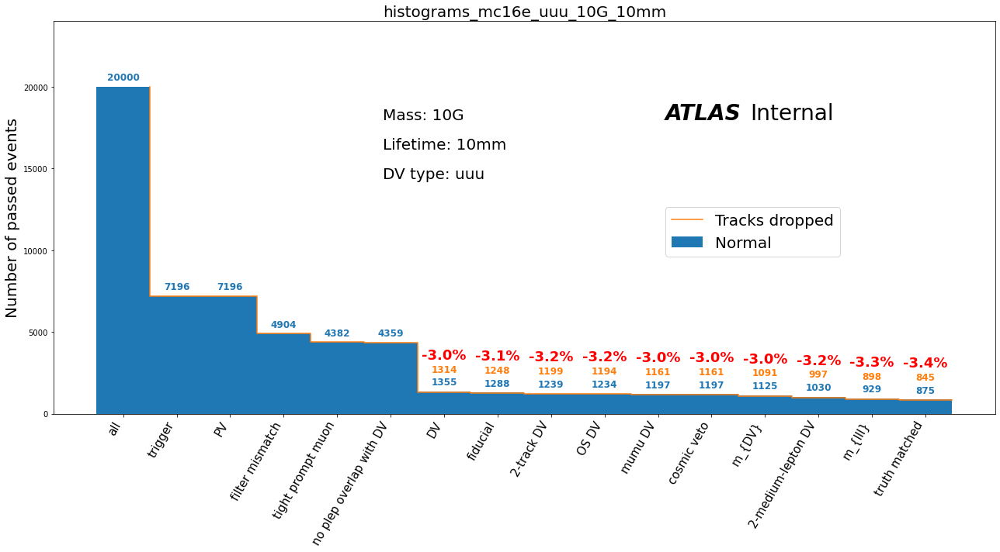

In [13]:
nominal = '/data/hnl/histograms/v4p0_histograms/histograms_mc16e_uuu_10G_10mm.root'
dropped = '/data/hnl/histograms/v4p1_histograms/histograms_mc16e_uuu_10G_10mm.root'
cutflow_dict_a, cutflow_dict_b = make_cutflows(nominal, dropped)

In [4]:
(cutflow_dict_a['m_{DV}'] - cutflow_dict_b['m_{DV}'])/ cutflow_dict_a['m_{DV}']

0.030222222222222223

In [55]:
masses = [3, 4, 4.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5]
lifetimes = {1:0, 10:1, 100:2}

def set_bin_content(mass, lifetime, value, arr):
    ybin = np.max(np.digitize(mass, masses)-1, 0)
    xbin = lifetimes[lifetime]
    arr[ybin,xbin] = value

def make_uncertainty_plot(histpath, title):

    uncertianty_arr = np.array([
    [ 0.0,0.0,0.0,],
    [ 0.0,0.0,0.0,],
    [ 0.0,0.0,0.0,],
    [ 0.0,0.0,0.0,],
    [ 0.0,0.0,0.0,],
    [ 0.0,0.0,0.0,],
    [ 0.0,0.0,0.0,],
    [ 0.0,0.0,0.0,],
    [ 0.0,0.0,0.0,],
    [ 0.0,0.0,0.0,],
    ])

    # get bins from ntuples    
    for hist_file in glob.glob(histpath):
        cutflow_dict_a, cutflow_dict_b = make_cutflows(hist_file, hist_file.replace('4p0','4p1'))
        diff_mdv = (cutflow_dict_a['m_{DV}'] - cutflow_dict_b['m_{DV}'])/ cutflow_dict_a['m_{DV}']

        tokens = hist_file.split('/')[4].split('_')
        file_lifetime = int(tokens[4].split('mm')[0])
        file_mass = float(tokens[3][:-1].replace('p','.'))
        set_bin_content(file_mass, file_lifetime, diff_mdv, uncertianty_arr)
        # set_bin_content(5, 1, mean, uncertianty_arr)

    # do the plotting
    plot_uncertainties(uncertianty_arr, title)
    return uncertianty_arr

def plot_uncertainties(uncertianty_arr, title):
    plt.figure(figsize=[7,8])
    plt.pcolormesh([0,1,2,3], masses, uncertianty_arr, vmin=0, vmax=.06)
    plt.colorbar()
    ax = plt.gca()
    ax.set_xticklabels(['','1 mm', '', '10 mm', '', '100 mm',])
    ax.set_yticks(masses)
    ax.set_title(title)
    ax.set_xlabel('lifetime [mm]')
    ax.set_ylabel('mass [GeV]')

    # set text
    for i in range(len(masses)-1):
        for j in range(len(lifetimes)):
            yloc = j+.5
            xloc = masses[i] + (masses[i+1]-masses[i])/2 
            text = ax.text(yloc, xloc , f'{uncertianty_arr[i,j]*100:0.2f}%',
                            ha="center", va="center", color="w", transform=ax.transData)
    plt.savefig(title+'.png', dpi=300)

/home/newhouse/.local/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/home/newhouse/.local/lib/python3.7/site-packages/ipykernel_launcher.py:41: UserWarning: FixedFormatter should only be used together with FixedLocator
/home/newhouse/.local/lib/python3.7/site-packages/ipykernel_launcher.py:41: UserWarning: FixedFormatter should only be used together with FixedLocator
/home/newhouse/.local/lib/python3.7/site-packages/ipykernel_launcher.py:41: UserWarning: FixedFormatter should only be used together with FixedLocator
/home/newhouse/.local/lib/python3.7/site-packages/ipykernel_launcher.py:41: UserWarning: FixedFormatter should only be used together with FixedLocator
Info in <TCanvas::Print>: png file /data/hnl/plots

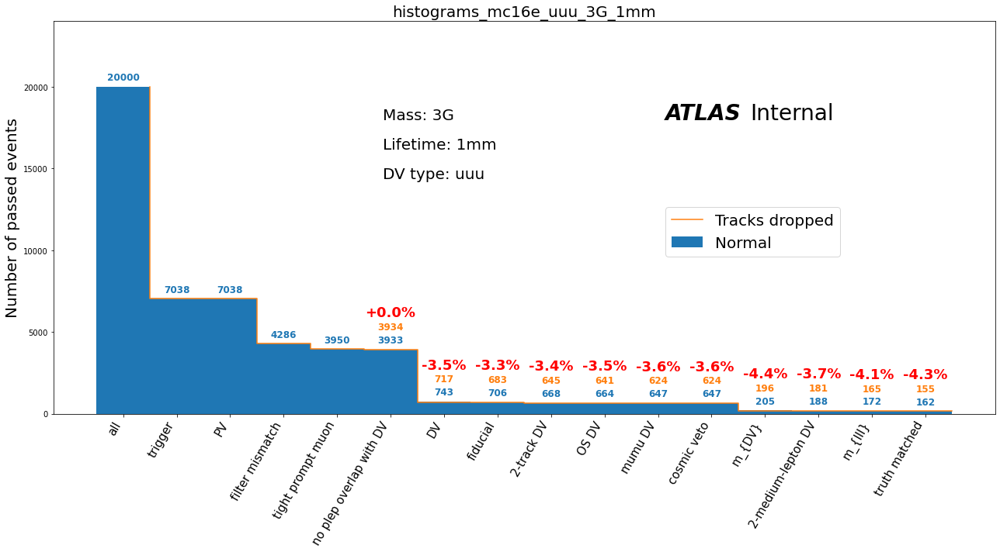

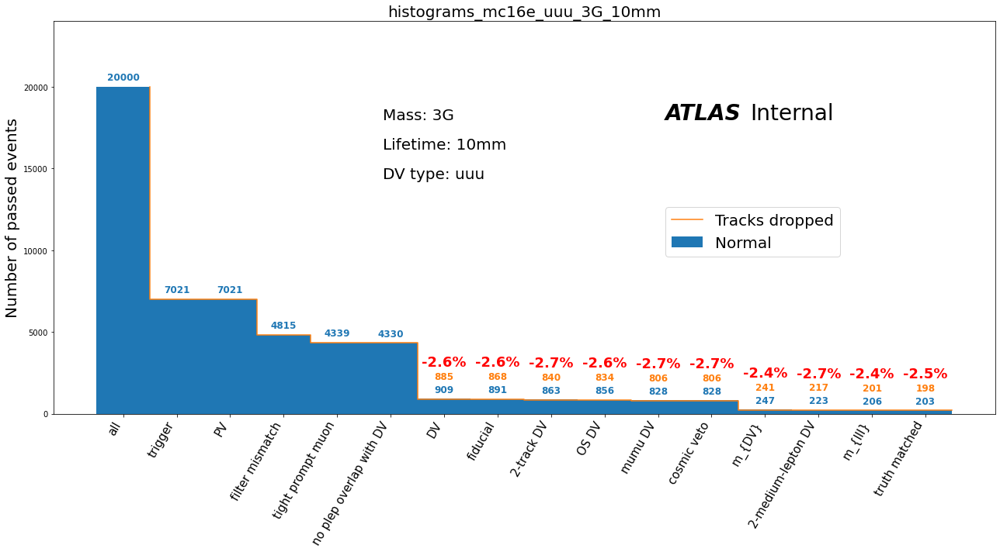

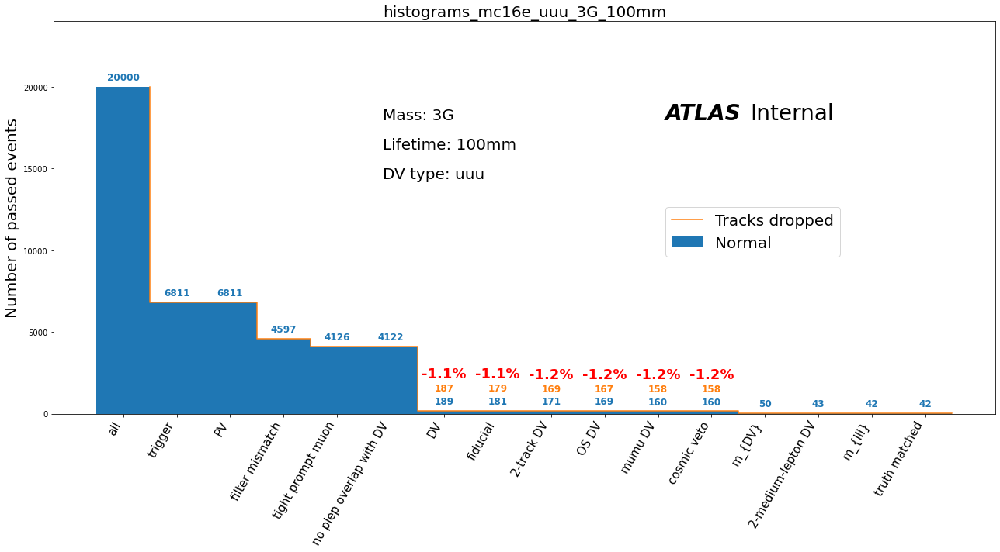

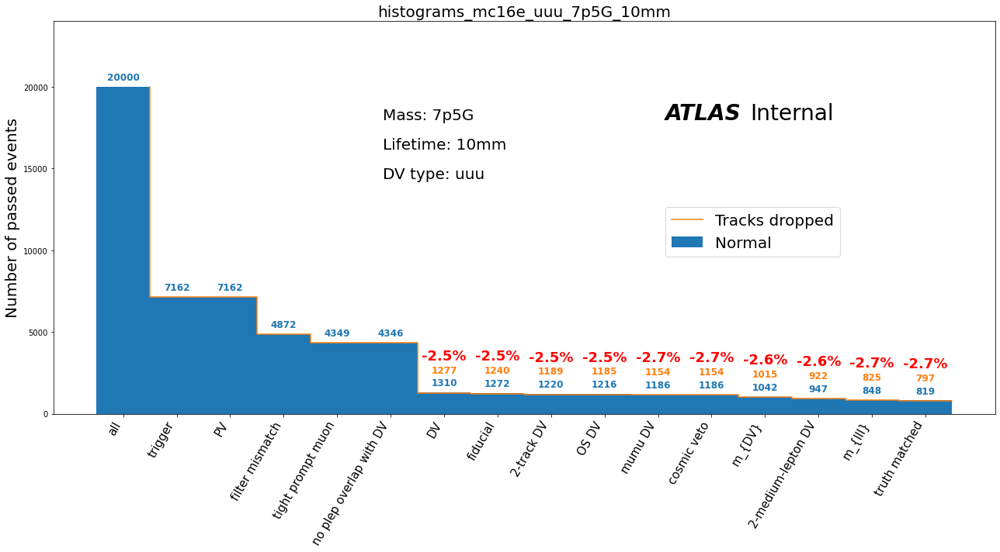

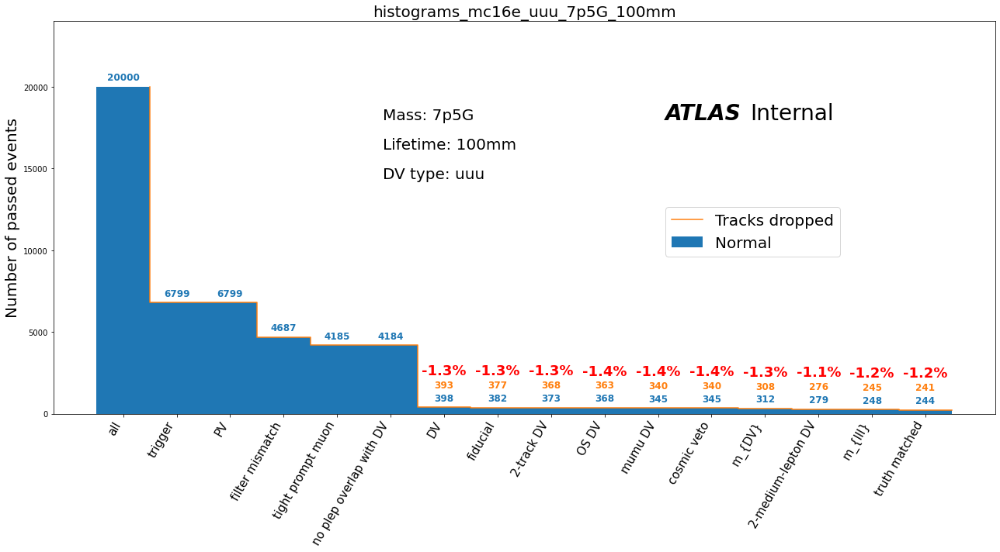

...

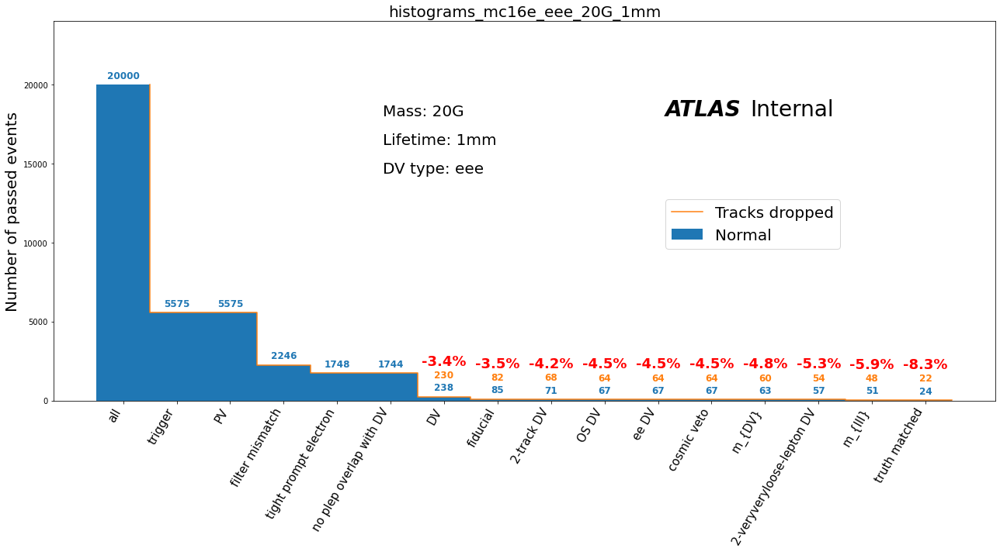

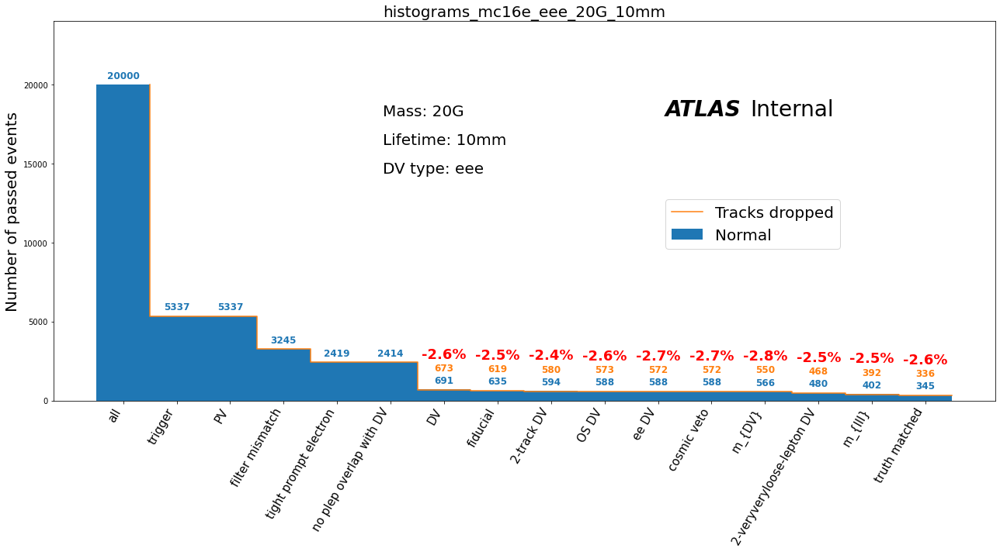

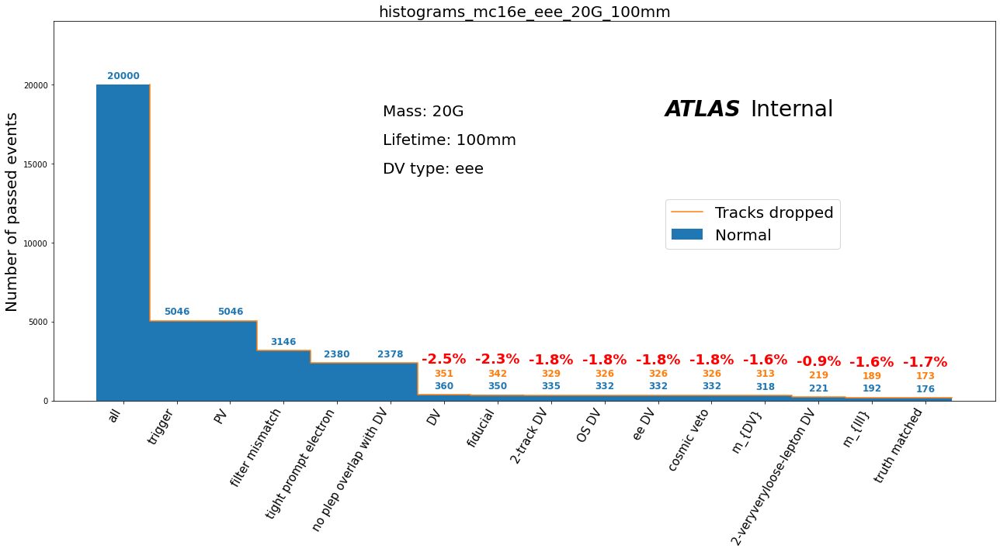

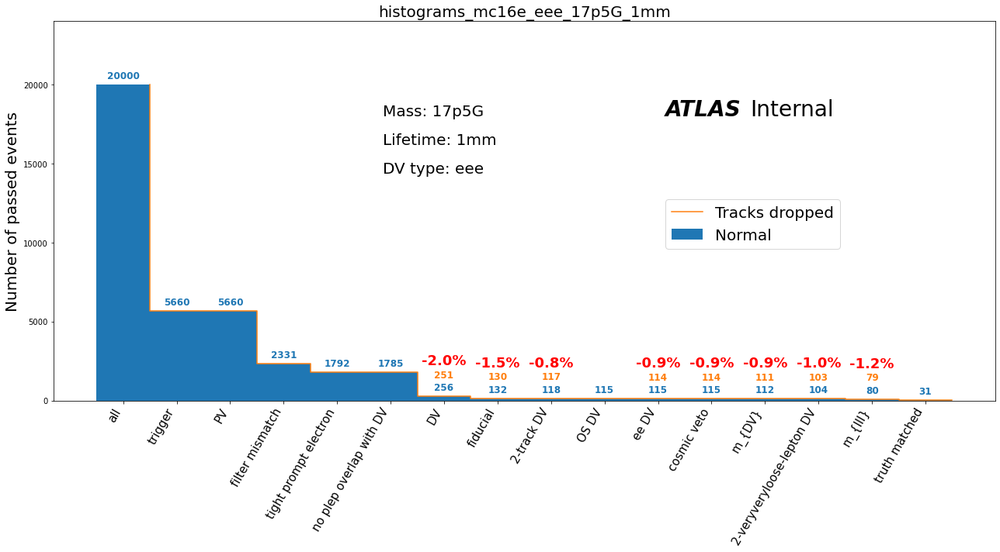

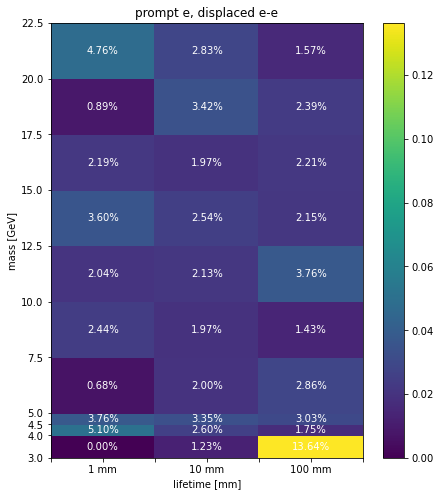

In [15]:
uuu_uncertianty_arr = make_uncertainty_plot(histpath='/data/hnl/v4p0_histograms/histograms_mc16e_uuu_*', title='prompt mu, displaced mu-mu')
uue_uncertianty_arr = make_uncertainty_plot(histpath='/data/hnl/v4p0_histograms/histograms_mc16e_uue_*', title='prompt mu, displaced mu-e')
eeu_uncertianty_arr = make_uncertainty_plot(histpath='/data/hnl/v4p0_histograms/histograms_mc16e_eeu_*', title='prompt e, displaced e-mu')
eee_uncertianty_arr = make_uncertainty_plot(histpath='/data/hnl/v4p0_histograms/histograms_mc16e_eee_*', title='prompt e, displaced e-e')

/home/newhouse/.local/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: FixedFormatter should only be used together with FixedLocator


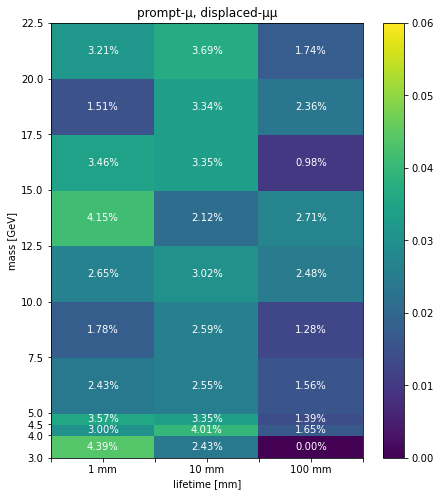

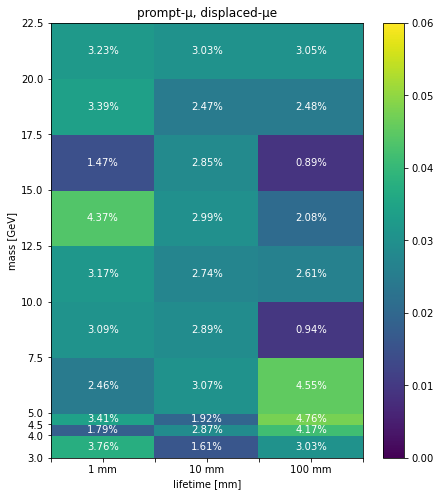

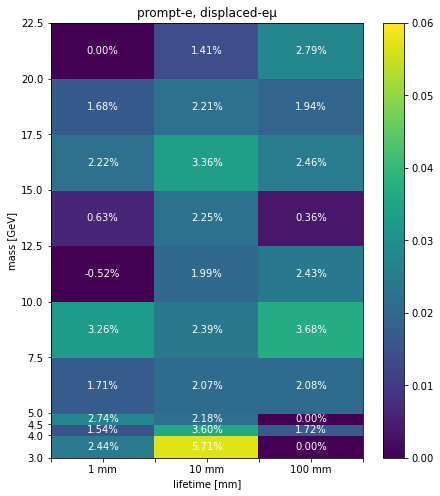

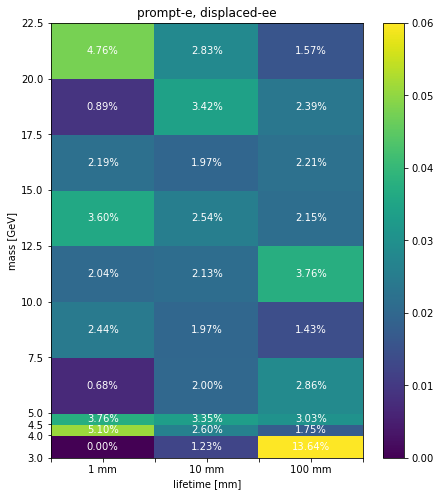

In [56]:
plot_uncertainties(uuu_uncertianty_arr, 'prompt-μ, displaced-μμ')
plot_uncertainties(uue_uncertianty_arr, 'prompt-μ, displaced-μe')
plot_uncertainties(eeu_uncertianty_arr, 'prompt-e, displaced-eμ')
plot_uncertainties(eee_uncertianty_arr, 'prompt-e, displaced-ee')

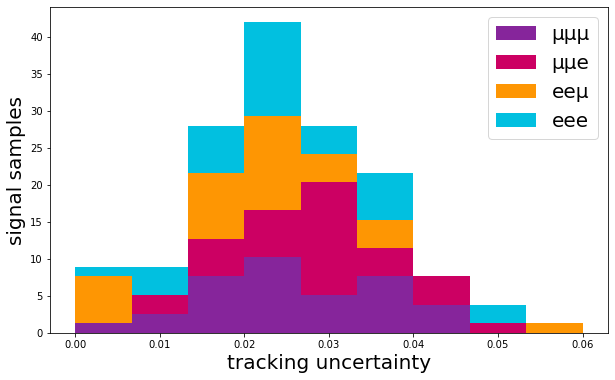

In [85]:
colors = {
    'uuu': '#86259B',
    'uue': '#CC0063',
    'eeu': '#FE9603',
    'eee': '#01C0E0',
}

plt.figure(figsize=[10,6])
plt.hist([
    uuu_uncertianty_arr.ravel(), 
    uue_uncertianty_arr.ravel(),
    eeu_uncertianty_arr.ravel(),
    eee_uncertianty_arr.ravel(),
], 
    bins=np.linspace(0,.06,10), 
    stacked=True,
    label=['μμμ', 'μμe','eeμ','eee'],
    color=[colors['uuu'], colors['uue'], colors['eeu'], colors['eee'], ],
    density=1
)
plt.legend(fontsize=20)
plt.xlabel('tracking uncertainty', fontsize=20)
plt.ylabel('signal samples', fontsize=20)
plt.savefig('tracking_uncertainty_1d.png', dpi=300)
# plt.hist(uue_uncertianty_arr.ravel(), bins=np.linspace(0,.06,10))